# Anomaly Detection in Airline Operations

This project revolves around the analysis of an airline dataset, aiming to derive valuable insights from the wealth of information it contains. By exploring various aspects such as passenger demographics, flight statuses and geographic distribution, the analysis seeks to uncover patters, trends, anomalies and key characteristics within the airline industry. Through a combination of data exploration, cleaning and visualization as well as interpretation, the project offers a comprehensive understanding of the dataset, ultimatley providing actionable information for stakeholders in the aviation domain. The visualizations and analysis conducted serve as tools for decision-makers to enhance operational efficiency, imrpove customer experiences, and make informed strategic decisions within the airline industry.

The Methodology of this project aligns with the general principles of exploratory data analysis (EAD). EAD is an approach to analyzing and visualizing datasets to summarize their main characteristics, often with the goal of uncovering patterns, trends, anomalies and relationships within the data. This projects goes further into answering specific questions that are commonly raised by stakeholders and provides presentations in the form of visualizations, in-depth analysis and communication of fidings and meaningful insights. 

Dataset can be downloaded from [Kaggle](https://www.kaggle.com/datasets/iamsouravbanerjee/airline-dataset?resource=download) :

* Passenger Details
        - 98,000+ Passengers
        - 50% Male, 50% Female
* Airport Details
        - 9000+ Airports
        - 32% in North America
        - 19% in Asia
        - 49% Other
* Flight Details
        - Departures for a year 2021-2022

# Project Content


1. Step 1: Install + Improt Necessary Libraries
2. Step 2: Reading + Exploring Data
3. Step 3: Data Cleaning
4. Step 4: Analysis per Category
5. Step 5: Anomaly Detection and Reduction
6. Step 6: Isolation Forest model
7. Step 7: Scenario Simulation of Historical Data
8. Step 8: Decision Support Tool Insights
9. Step 9: Overall Summary Dashboard

## Step 1: Install + Import Necessary Libraries

In [7]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import os

from sklearn.ensemble import IsolationForest
from sklearn.preprocessing import StandardScaler

## Step 2: Reading + Exploring Data

In [9]:
df=pd.read_csv("Airline Dataset Updated - v2.csv")

This will show the first 10 rows of the DataFrame, providing a snapshot of the data's structure and content.

In [11]:
df.head(10)

,Passenger ID,First Name,Last Name,Gender,Age,Nationality,Airport Name,Airport Country Code,Country Name,Airport Continent,Continents,Departure Date,Arrival Airport,Pilot Name,Flight Status
0,ABVWIg,Edithe,Leggis,Female,62,Japan,Coldfoot Airport,US,United States,NAM,North America,6/28/2022,CXF,Fransisco Hazeldine,On Time
1,jkXXAX,Elwood,Catt,Male,62,Nicaragua,Kugluktuk Airport,CA,Canada,NAM,North America,12/26/2022,YCO,Marla Parsonage,On Time
2,CdUz2g,Darby,Felgate,Male,67,Russia,Grenoble-Isère Airport,FR,France,EU,Europe,1/18/2022,GNB,Rhonda Amber,On Time
3,BRS38V,Dominica,Pyle,Female,71,China,Ottawa / Gatineau Airport,CA,Canada,NAM,North America,9/16/2022,YND,Kacie Commucci,Delayed
4,9kvTLo,Bay,Pencost,Male,21,China,Gillespie Field,US,United States,NAM,North America,2/25/2022,SEE,Ebonee Tree,On Time
5,nMJKVh,Lora,Durbann,Female,55,Brazil,Coronel Horácio de Mattos Airport,BR,Brazil,SAM,South America,06-10-2022,LEC,Inglis Dolley,On Time
6,8IPFPE,Rand,Bram,Male,73,Ivory Coast,Duxford Aerodrome,GB,United Kingdom,EU,Europe,10/30/2022,QFO,Stanislas Tiffin,Cancelled
7,pqixbY,Perceval,Dallosso,Male,36,Vietnam,Maestro Wilson Fonseca Airport,BR,Brazil,SAM,South America,04-07-2022,STM,Sharyl Eastmead,Cancelled
8,QNAs2R,Aleda,Pigram,Female,35,Palestinian Territory,Venice Marco Polo Airport,IT,Italy,EU,Europe,8/20/2022,VCE,Daryn Bardsley,On Time
9,3jmudz,Burlie,Schustl,Male,13,Thailand,Vermilion Airport,CA,Canada,NAM,North America,04-06-2022,YVG,Alameda Carlyle,On Time


This will provide us with a concise summary of the DataFrame, including the number of non-null entries and the data types of each column.

In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 98619 entries, 0 to 98618
Data columns (total 15 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   Passenger ID          98619 non-null  object
 1   First Name            98619 non-null  object
 2   Last Name             98619 non-null  object
 3   Gender                98619 non-null  object
 4   Age                   98619 non-null  int64 
 5   Nationality           98619 non-null  object
 6   Airport Name          98619 non-null  object
 7   Airport Country Code  98619 non-null  object
 8   Country Name          98619 non-null  object
 9   Airport Continent     98619 non-null  object
 10  Continents            98619 non-null  object
 11  Departure Date        98619 non-null  object
 12  Arrival Airport       98619 non-null  object
 13  Pilot Name            98619 non-null  object
 14  Flight Status         98619 non-null  object
dtypes: int64(1), object(14)
memory usage

This method returns the number of unique values for each column in the DataFrame. Allows us to understand the cardinality of each feature in your dataset.

In [15]:
df.nunique()

Passenger ID            98619
First Name               8437
Last Name               41658
Gender                      2
Age                        90
Nationality               240
Airport Name             9062
Airport Country Code      235
Country Name              235
Airport Continent           6
Continents                  6
Departure Date            364
Arrival Airport          9024
Pilot Name              98605
Flight Status               3
dtype: int64

# Step 3: Data Cleaning

This calculates the total number of missing values in your DataFrame.

In [18]:
df.isnull().sum().sum()

0

Converting the "Gender" column in the DataFrame to a categorical data type using the astype method.
Categorical data types are useful when dealing with columns that have a limited, fixed set of unique values.

In [20]:
df['Gender']=df['Gender'].astype('category')
df['Gender'].unique()

['Female', 'Male']
Categories (2, object): ['Female', 'Male']

Converting the "Age" column in the DataFrame to integer data type.

In [22]:
df['Age']=df['Age'].astype(int)

Create a 2x2 grid of bar plots for columns in the DataFrame where the number of unique values is less than 10.

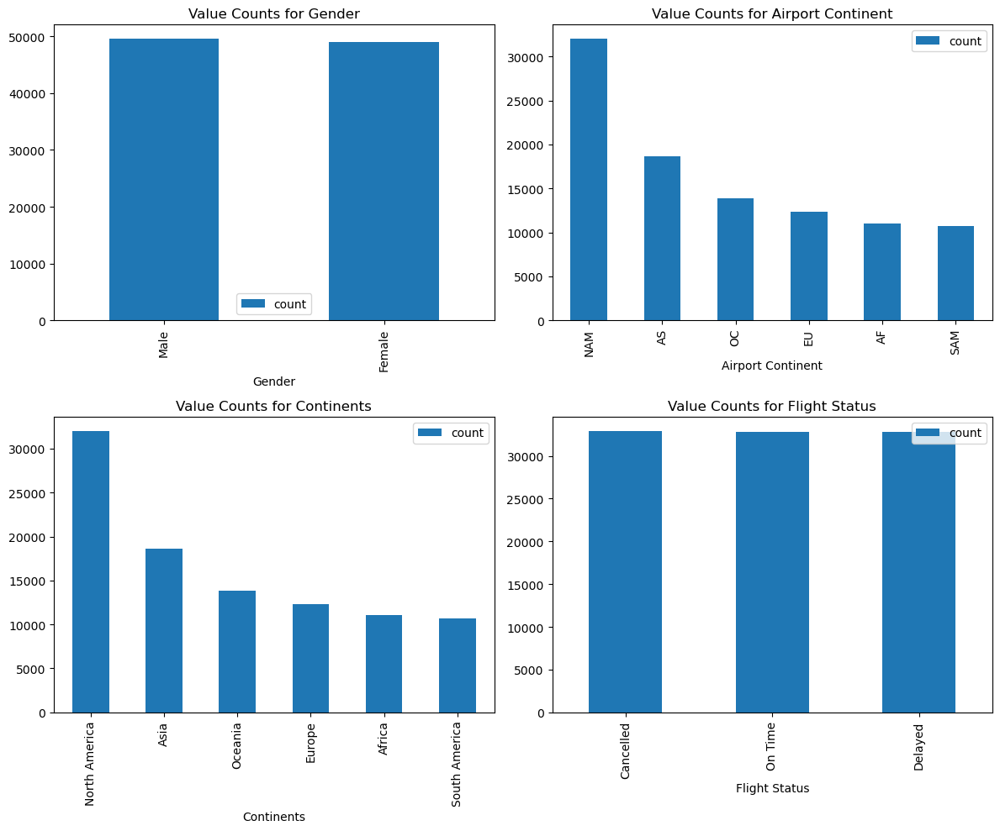

In [24]:
columns = [key for key, value in df.nunique().to_dict().items() if value < 10]
fig, ax = plt.subplots(2, 2, figsize=(12, 10))  # Fixed 2x2 grid
ax = ax.ravel()

for index, column in enumerate(columns[:len(ax)]):  # Limit to available axes
    df[column].value_counts().plot(ax=ax[index], kind='bar', legend=True)
    ax[index].set_title(f"Value Counts for {column}")

plt.tight_layout()
plt.show()

# Step 4: Analysis per Category

This method on the "Gender" column counts the occurances of each unique value(category) in that column. The result is a Pandas Series where the index consists of unique values in the "Gender" column, and the values are the corresponding counts.

In [27]:
count_1 = df['Gender'].value_counts()
count_1

Gender
Male      49598
Female    49021
Name: count, dtype: int64

Distribution of Passengers across Different Genders:

* Creates a pie chart and displays the counts and the names set to the unique categories in the "Gender" column.

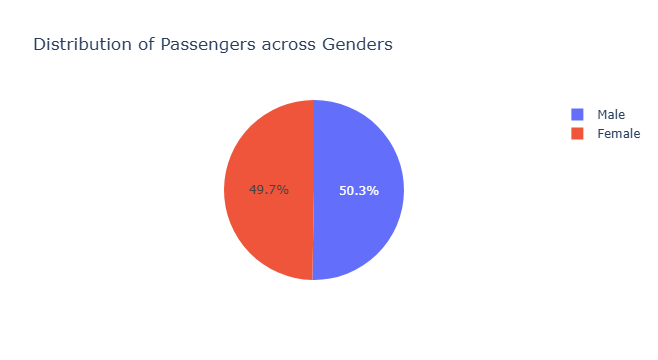

In [29]:
fig = px.pie(count_1, values = count_1.values, names=count_1.index,
             title = "Distribution of Passengers across Genders")
fig.show()

Create a bar chart to visualize the top 10 airport countries with the most passengers, the United States being the country with the most and India with the least amount of passengers of less than 5000.

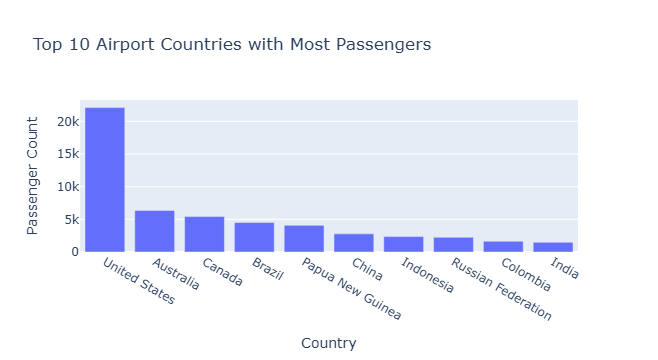

In [31]:
count_2 = df['Country Name'].value_counts()
fig = px.bar(count_2.head(10), x=count_2.head(10).index, y=count_2.head(10).values,
             title = 'Top 10 Airport Countries with Most Passengers', 
             labels = {'x': 'Country', 'y': 'Passenger Count'})
fig.show()

Creating a new DataFrame df_c from the count_2 Series by converting the index and values into the columns and renaming the columns. After executing this code, df_c will be a DataFrame with two columns: "Values" and "Count", where "Value" represents the country names, and "Count =" represents the corresponding passenger counts. This format is often useful for further analysis or visualization.

In [33]:
df_c = pd.DataFrame(count_2).reset_index().rename(columns = {"index": "value", 0: "count"})

Merging two DataFrames, df_c and con, using the "Country Name" column. The code below removes duplicate rows based on the "Country Name" column in the con DataFrame ensuring that each country appears only once.

In [35]:
con = df.loc[:, ['Country Name', 'Continents']]
con = con.drop_duplicates()
new_df = pd.merge_ordered(df_c, con, fill_method = 'ffill', on = 'Country Name')

Create a sunburst chart to visualize the distribution of passengers across continents and countries. The values parameter represents the numerical values associated with each category, in this case, the passengers.

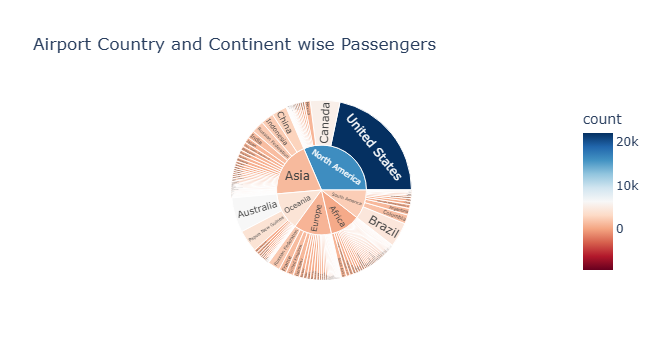

In [37]:
fig = px.sunburst (new_df, path = ['Continents', 'Country Name'], values = 'count',
                   color = 'count',
                   color_continuous_scale = 'RdBu',
                   color_continuous_midpoint = np.average(new_df['count'], weights = new_df['count']),
                   title = "Airport Country and Continent wise Passengers")
fig.show()

Create both a histogram and a countplot to visualize the distribution of passengers' ages, potentially based on gender.

* The historgram displays the count of passengers' age based on their gender.
* the Countplot displays the count of occurrences for each age.

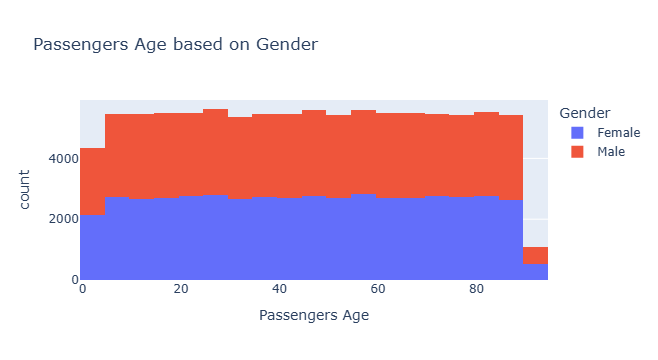

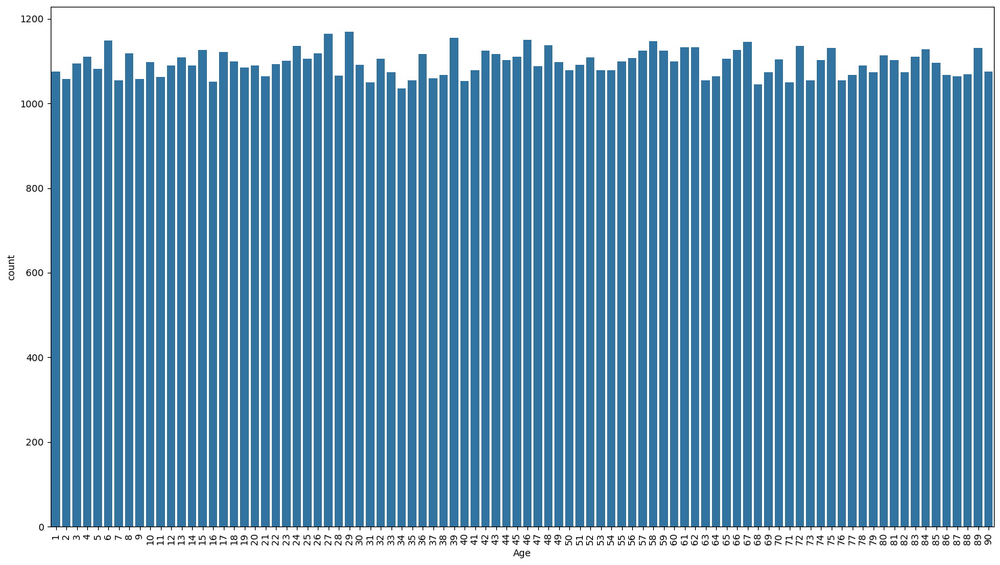

In [39]:
fig = px.histogram(df, x = 'Age', nbins = 20, color = 'Gender', 
                   title = 'Passengers Age based on Gender', 
                   labels = {'Age': 'Passengers Age'})
fig.show()
plt.figure(figsize = (18, 10))
sns.countplot(data = df, x = 'Age')
plt.xticks(rotation = 90)
plt.show()

Create a box plot to visualize the distribution of ages by gender. A reitteration of the previous plots but providing this visual to give a different point of view.

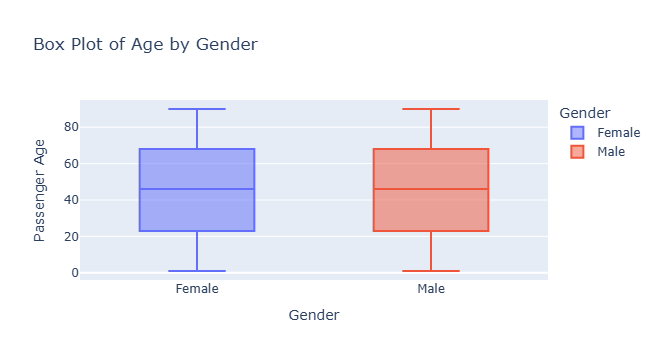

In [41]:
fig = px.box(df, x = 'Gender', y = 'Age', color = 'Gender',
             title = 'Box Plot of Age by Gender',
             labels = {'Age': 'Passenger Age'})
fig.show()

Creating a new DataFrame to store the counts of unique values in the "Nationality" column of the original DataFrame df. In addition, the below code also calculates the counts of occurrences for each unique value in the "Nationality" column. 

In [43]:
nationality = pd.DataFrame(df['Nationality'].value_counts()).reset_index()
nationality = nationality.head(20)
nationality.sort_values(by='Nationality', ascending = False, inplace = True)

Create a pie chart to visualize the distribution of counts across different nationalities. The nationality DataFrame is used as the data source.

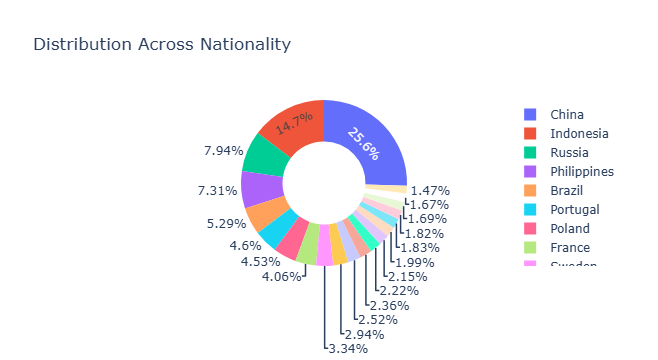

In [45]:
fig = px.pie(nationality, values = 'count', names = 'Nationality', hole = 0.5, title = 'Distribution Across Nationality')
fig.show()

Create a new DataFrame, fl_stat, to store the counts of unique values in the "Flight Status" column of the original DataFrame df. It also calculates the counts of occurrences for each unique value in the "Flight Status" column. 

In [47]:
fl_stat = pd.DataFrame(df['Flight Status'].value_counts()).reset_index()

Create a pie chart to visualize the distribution of flight statuses based on the status of the flights. fl_stat is used as the data source.

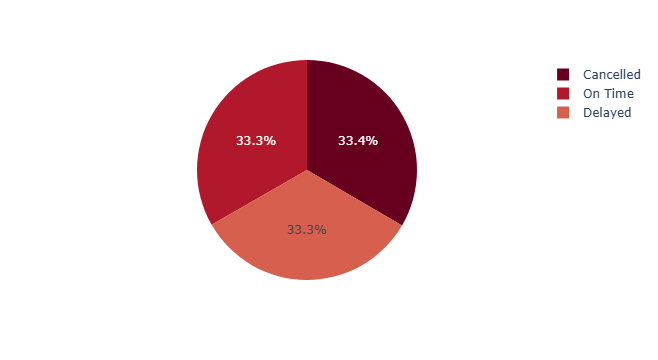

In [49]:
fig = px.pie(fl_stat, values = 'count', names = 'Flight Status', color_discrete_sequence = px.colors.sequential.RdBu)
fig.show()

# Step 5: Data Cleaning And Anomaly Reduction

#### Second part of the project that explores the anomalies of this dataset further and answers a series of commonly asked questions by stakeholders and provides meaningful insight as well as a concise summary as a final presentation of findings.

### 1. What are the common anonmalies in the dataset (eg. missing values, duplicates, outliers), and how can they be addressed to imporve data quality?

In [53]:
#identify missing values
missing_values = df.isnull().sum()
print("Missing Values:\n",missing_values)

Missing Values:
 Passenger ID            0
First Name              0
Last Name               0
Gender                  0
Age                     0
Nationality             0
Airport Name            0
Airport Country Code    0
Country Name            0
Airport Continent       0
Continents              0
Departure Date          0
Arrival Airport         0
Pilot Name              0
Flight Status           0
dtype: int64


In [54]:
#Drop duplicates
df.drop_duplicates()

,Passenger ID,First Name,Last Name,Gender,Age,Nationality,Airport Name,Airport Country Code,Country Name,Airport Continent,Continents,Departure Date,Arrival Airport,Pilot Name,Flight Status
0,ABVWIg,Edithe,Leggis,Female,62,Japan,Coldfoot Airport,US,United States,NAM,North America,6/28/2022,CXF,Fransisco Hazeldine,On Time
1,jkXXAX,Elwood,Catt,Male,62,Nicaragua,Kugluktuk Airport,CA,Canada,NAM,North America,12/26/2022,YCO,Marla Parsonage,On Time
2,CdUz2g,Darby,Felgate,Male,67,Russia,Grenoble-Isère Airport,FR,France,EU,Europe,1/18/2022,GNB,Rhonda Amber,On Time
3,BRS38V,Dominica,Pyle,Female,71,China,Ottawa / Gatineau Airport,CA,Canada,NAM,North America,9/16/2022,YND,Kacie Commucci,Delayed
4,9kvTLo,Bay,Pencost,Male,21,China,Gillespie Field,US,United States,NAM,North America,2/25/2022,SEE,Ebonee Tree,On Time
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
98614,hnGQ62,Gareth,Mugford,Male,85,China,Hasvik Airport,NO,Norway,EU,Europe,12-11-2022,HAA,Pammie Kingscote,Cancelled
98615,2omEzh,Kasey,Benedict,Female,19,Russia,Ampampamena Airport,MG,Madagascar,AF,Africa,10/30/2022,IVA,Dorice Lochran,Cancelled
98616,VUPiVG,Darrin,Lucken,Male,65,Indonesia,Albacete-Los Llanos Airport,ES,Spain,EU,Europe,09-10-2022,ABC,Gearalt Main,On Time
98617,E47NtS,Gayle,Lievesley,Female,34,China,Gagnoa Airport,CI,Côte d'Ivoire,AF,Africa,10/26/2022,GGN,Judon Chasle,Cancelled


In [55]:
#Detect outliers using IQR
numeric_df = df.select_dtypes(include = 'number')
Q1 = numeric_df.quantile(0.25)
Q3 = numeric_df.quantile(0.75)
IQR = Q3 - Q1
outliers = ((numeric_df < (Q1 - 1.5*IQR)) | (numeric_df > (Q3 + 1.5 * IQR))).sum()
print("Outliers:\n", outliers)

Outliers:
 Age    0
dtype: int64


In [56]:
#Replace missing values with median or mode
numeric_cols = df.select_dtypes(include = "number")
df[numeric_cols.columns] = numeric_cols.fillna(numeric_cols.median())

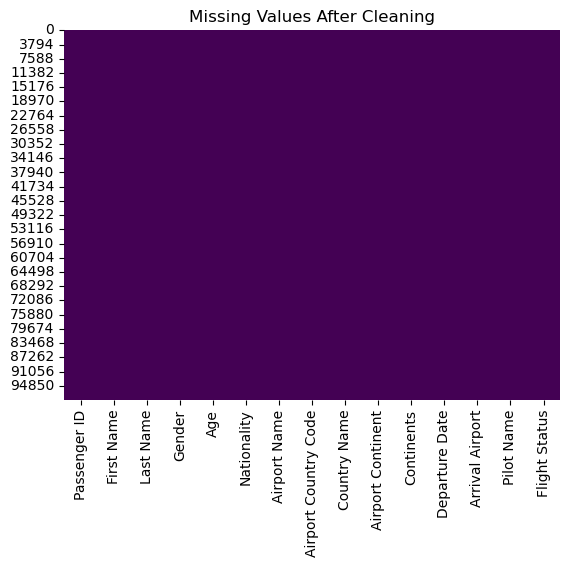

In [57]:
#Visualize data quality improvements
sns.heatmap(df.isnull(), cbar=False, cmap="viridis")
plt.title("Missing Values After Cleaning")
plt.show()

#The heatmap showing no yellow within the 'virdis' confirms that after cleaning the data, there are no yellow or "missing" areas, indicating that all missing values have been addressed.

# Step 6: Anomaly Detection with Machine Learning (Isolation Forest model)

### 2. Can we detect anomalies in operational data using an Isolation Forest model?

In [60]:
#Standardize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(df.select_dtypes(include = np.number))

In [61]:
#Train Isolation Forest
model = IsolationForest(contamination = 0.05, random_state = 42)
df['anomaly'] = model.fit_predict(scaled_data)

In [62]:
#Count Anomalies
print("Anomalies detected:", df['anomaly'].value_counts())

Anomalies detected: anomaly
 1    94279
-1     4340
Name: count, dtype: int64


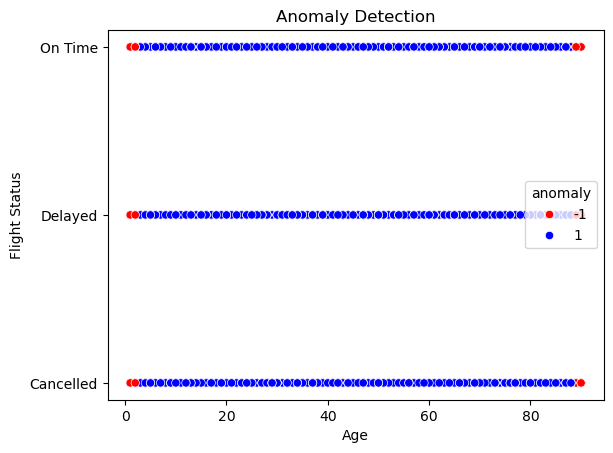

In [63]:
#Visualize anomalies
sns.scatterplot(x=df['Age'], y=df['Flight Status'], hue=df['anomaly'], palette={1: 'blue', -1: 'red'})
plt.title("Anomaly Detection")
plt.show()

# Step 7: Scenario Simulation of Historical Data

### 3. How do simulated operational scenarios compare to historical data?

In [66]:
#Simulate operational data
simulated_data = df.copy()
simulated_data['Age'] = np.random.normal(loc=df['Age'].mean(), scale = df['Age'].std(), size = len(df))

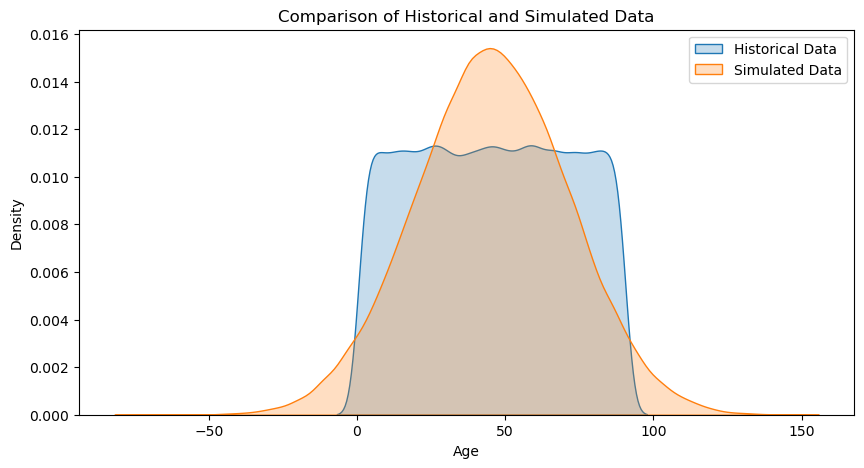

In [67]:
#Compare distributions
plt.figure(figsize = (10, 5))
sns.kdeplot(df['Age'], label = 'Historical Data', fill = True)
sns.kdeplot(simulated_data['Age'], label = 'Simulated Data', fill = True)
plt.legend()
plt.title("Comparison of Historical and Simulated Data")
plt.show()

# Step 8: Decision Support Tool Insights

### 4. What actionable insights can we provide to reduce downtime and improve efficiency?

In [70]:
#Aggregate data by category
departure_counts = df.groupby('Flight Status')['Departure Date'].count().sort_values()
departure_counts

Flight Status
Delayed      32831
On Time      32846
Cancelled    32942
Name: Departure Date, dtype: int64

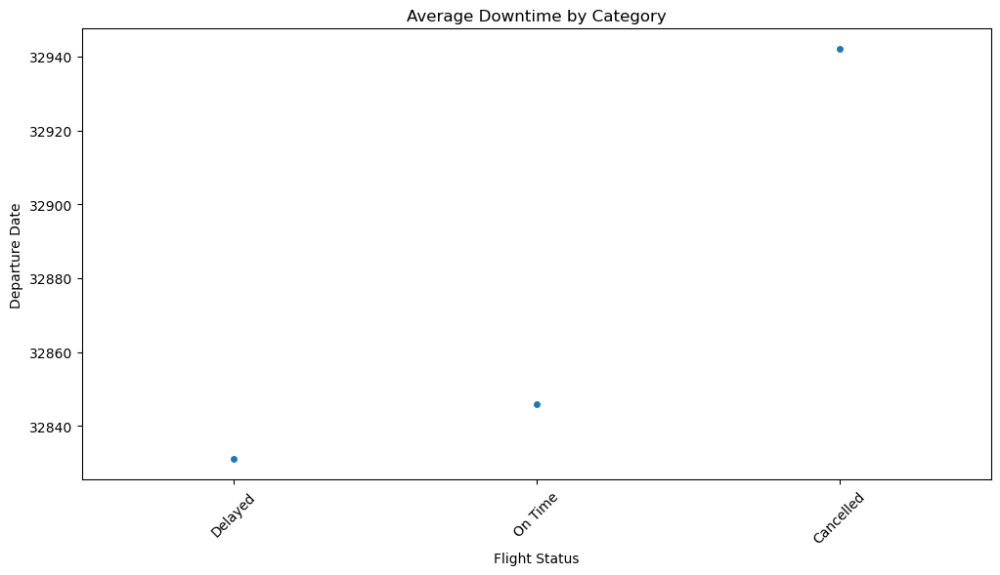

In [71]:
#Visualize Actionable insights
plt.figure(figsize=(12,6))
sns.stripplot(x=departure_counts.index, y=departure_counts.values)
plt.title("Average Downtime by Category")
plt.xlabel('Flight Status')
plt.ylabel('Departure Date')
plt.xticks(rotation = 45)
plt.show()

# Step 9: Overall Summary Dashboard

### 5. Can we create a visualization dashboard summarizing the key insights?

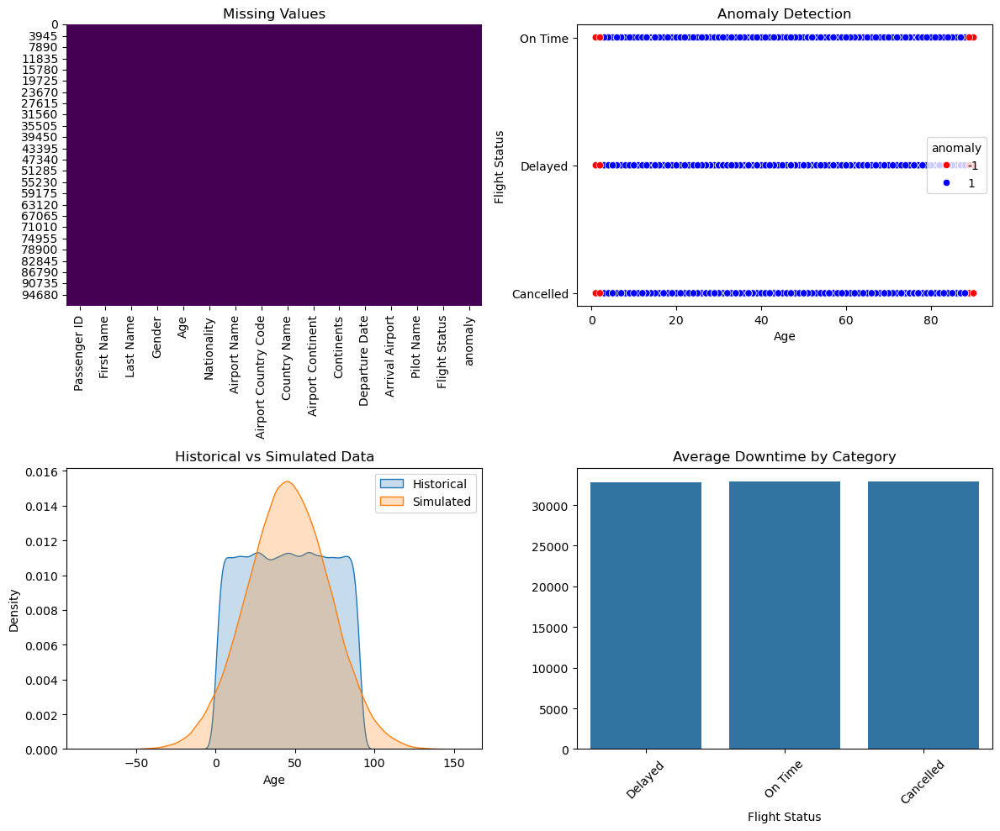

In [74]:
fig, ax = plt.subplots(2, 2, figsize=(12, 10))

# Missing Values heatmap
sns.heatmap(df.isnull(), cbar=False, cmap='viridis', ax=ax[0, 0])
ax[0, 0].set_title("Missing Values")

# Outlier detection scatterplot
sns.scatterplot(x=df['Age'], y=df['Flight Status'], hue=df['anomaly'], palette={1: 'blue', -1: 'red'}, ax=ax[0, 1])
ax[0, 1].set_title("Anomaly Detection")

# Distribution Comparison
sns.kdeplot(df['Age'], label='Historical', fill=True, ax=ax[1, 0])
sns.kdeplot(simulated_data['Age'], label='Simulated', fill=True, ax=ax[1, 0])
ax[1, 0].legend()
ax[1, 0].set_title("Historical vs Simulated Data")

# Flight Statuses
sns.barplot(x=departure_counts.index, y=departure_counts.values, ax=ax[1, 1])
ax[1, 1].set_title("Average Downtime by Category")
ax[1, 1].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()